In [1]:
%load_ext autoreload
%autoreload 2

import os

os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".9"
os.environ["WANDB_NOTEBOOK_NAME"] = "ssilvae.ipynb"

from ml_collections import config_dict
import jax.random as random
import jax.numpy as jnp
from absl import logging

from src.utils.training import setup_model, get_dataset_splits, train_loop

# set save plot face color to be white
import matplotlib.pyplot as plt
plt.rcParams["savefig.facecolor"] = "white"

In [2]:
RUN_EXTRA = False

In [3]:
logging.set_verbosity(logging.INFO)

In [4]:
rng = random.PRNGKey(0)
data_rng, model_rng = random.split(rng)

In [5]:
def get_config(angle) -> config_dict.ConfigDict:
    config = config_dict.ConfigDict()

    # Dataset config
    config.dataset = 'MNIST'
    # config.data_dir = '~/data'
    config.shuffle_buffer_size = 50_000
    config.repeat_after_batch = True  # NOTE: ordering of PP and repeat is important!
    config.train_split = 'train[10000:]'
    config.pp_train = f'value_range(-1, 1)|random_rotate(-{angle}, {angle}, fill_value=-1)|keep(["image"])'
    config.val_split = 'train[:10000]'
    config.pp_eval = f'value_range(-1, 1)|random_rotate(-{angle}, {angle}, fill_value=-1)|keep(["image", "label"])'

    # Model config
    config.model_name = 'SSILVAE'
    config.model = config_dict.ConfigDict()
    config.model.bounds = (0.25, 0.25, jnp.pi, 0.25, 0.25)
    config.model.offset = (0., 0., 0., 0., 0.)
    config.model.latent_dim = 128
    # q(Z|X̂) config
    config.model.Z_given_Xhat = config_dict.ConfigDict()
    config.model.Z_given_Xhat.conv_dims = [64, 128, 256]
    config.model.Z_given_Xhat.dense_dims = [256]
    # p(X̂|Z) config
    config.model.Xhat_given_Z = config_dict.ConfigDict()
    config.model.Xhat_given_Z.conv_dims = [256, 128, 64]
    config.model.Xhat_given_Z.dense_dims = [256]
    # p(η|Xhat) config
    config.model.Η_given_Xhat = config_dict.ConfigDict()
    config.model.Η_given_Xhat.num_layers = 1
    config.model.Η_given_Xhat.num_bins = 5
    config.model.Η_given_Xhat.base = config_dict.ConfigDict()
    config.model.Η_given_Xhat.base.dense_dims = [64, 32, 16]
    config.model.Η_given_Xhat.base.conv_dims = []
    config.model.Η_given_Xhat.base.dropout_rate = 0.
    config.model.Η_given_Xhat.conditioner = config_dict.ConfigDict()
    config.model.Η_given_Xhat.conditioner.hidden_dims = [256, 128]
    config.model.Η_given_Xhat.conditioner.dropout_rate = 0.
    config.model.Η_given_Xhat.trunk = config_dict.ConfigDict()
    config.model.Η_given_Xhat.trunk.dense_dims = [256]
    config.model.Η_given_Xhat.trunk.conv_dims = [32, 64, 128]
    config.model.Η_given_Xhat.trunk.dropout_rate = 0.
    # p(η|X) config
    config.model.Η_given_X = config.model.Η_given_Xhat

    # Training config
    per_stage_steps = 5000
    config.total_steps = per_stage_steps * 2 + 1
    config.eval_every = 500
    config.batch_size = 512

    ## Parameter parition config
    config.reset_step = per_stage_steps
    config.partition_names = ('SSIL', 'VAE')
    config.lr_schedule_halfs = ('first', 'second')
    config.partition_fn = lambda path, _: 'SSIL' if path[0] in ('p_Η_given_Xhat', 'q_Η_given_X', 'σ_') else 'VAE'

    ## Optimizer config
    config.optim_name = ('adamw', 'adamw')
    config.learning_rate = (3e-4, 1e-4)
    config.optim = (config_dict.ConfigDict(), config_dict.ConfigDict())
    config.optim[0].weight_decay = 1e-4
    config.optim[1].weight_decay = 1e-4

    ## LR config
    config.lr_schedule_name = ('warmup_cosine_decay_schedule', 'warmup_cosine_decay_schedule')
    config.lr_schedule = (config_dict.ConfigDict(), config_dict.ConfigDict())
    for i in range(len(config.lr_schedule)):
        config.lr_schedule[i].peak_value = 10 * config.learning_rate[i]
        config.lr_schedule[i].end_value = 1 * config.learning_rate[i]
        config.lr_schedule[i].decay_steps = per_stage_steps
        config.lr_schedule[i].warmup_steps = per_stage_steps // 10

    ## α config
    config.α = 1

    ## β config
    config.β_schedule_half = 'second'
    config.β = 10
    config.β_schedule_name = "cosine_decay_schedule"
    config.β_schedule = config_dict.ConfigDict()
    β_end_value = 1
    config.β_schedule.alpha = β_end_value / config.β
    config.β_schedule.decay_steps = per_stage_steps

    ## γ config
    config.γ_schedule_half = 'first'
    config.γ = 30
    config.γ_schedule_name = "cosine_decay_schedule"
    config.γ_schedule = config_dict.ConfigDict()
    γ_end_value = 
    config.γ_schedule.alpha = γ_end_value / config.γ
    config.γ_schedule.decay_steps = per_stage_steps

    return config

config = get_config(45)

In [6]:
train_ds, val_ds, _ = get_dataset_splits(config, data_rng, config.batch_size, config.batch_size)

INFO:absl:Initializing train dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Field info.citation from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.splits from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.supervised_keys from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.module_name from disk and from code do not match. Keeping the one from code.
INFO:absl:Constructing tf.data.Dataset mnist for split _EvenSplit(split='train[10000:]', index=0, count=1, drop_remainder=False), from /homes/jua23/tensorflow_datasets/mnist/3.0.1


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


INFO:absl:Features before preprocessing: {'image': 'uint8[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


INFO:absl:Features after op ValueRange(vmin=-1, vmax=1, in_min=0, in_max=255.0, clip_values=False, key='image', key_result=None):
{'image': 'float32[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op RandomRotate(θ_min=-0.7853981633974483, θ_max=0.7853981633974483, fill_mode='nearest', fill_value=-1, key='image', key_result=None, rng_key='rng'):
{'image': 'float32[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Features after op Keep(keys=['image']):
{'image': 'float32[28, 28, 1]'}
INFO:absl:Features after preprocessing: {'image': 'float32[28, 28, 1]'}
INFO:absl:Initializing val dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Field info.citation from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.splits from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.supervised_keys from disk and from code do not match. Keeping the one fro

In [7]:
model, state = setup_model(config, model_rng, train_ds)

INFO:absl:Initializing model...
INFO:absl:config.model_name = SSILVAE
INFO:absl:config.model = Xhat_given_Z:
  conv_dims:
  - 256
  - 128
  - 64
  dense_dims:
  - 256
Z_given_Xhat:
  conv_dims:
  - 64
  - 128
  - 256
  dense_dims:
  - 256
bounds: !!python/tuple
- 0.25
- 0.25
- 3.141592653589793
- 0.25
- 0.25
latent_dim: 128
offset: !!python/tuple
- 0.0
- 0.0
- 0.0
- 0.0
- 0.0
"\u0397_given_X": &id001
  base:
    conv_dims: []
    dense_dims:
    - 64
    - 32
    - 16
    dropout_rate: 0.0
  conditioner:
    dropout_rate: 0.0
    hidden_dims:
    - 256
    - 128
  num_bins: 5
  num_layers: 1
  trunk:
    conv_dims:
    - 32
    - 64
    - 128
    dense_dims:
    - 256
    dropout_rate: 0.0
"\u0397_given_Xhat": *id001

INFO:absl:input_size = (28, 28, 1)
INFO:absl:Initializing model...
INFO:absl:
+------------------------------------------------+------------------+------------+-----------+----------+
| Name                                           | Shape            | Size       | Mean 

wandb: Currently logged in as: jamesallingham (invariance-learners). Use `wandb login --relogin` to force relogin


INFO:absl:Setting up datasets...
INFO:absl:Global batch size 512 on 1 hosts results in 512 local batch size. With 1 devices per host (1 devices total), that's a 512 per-device batch size.
INFO:absl:Initializing train dataset...
INFO:absl:Load dataset info from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Field info.citation from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.splits from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.supervised_keys from disk and from code do not match. Keeping the one from code.
INFO:absl:Field info.module_name from disk and from code do not match. Keeping the one from code.
INFO:absl:Constructing tf.data.Dataset mnist for split _EvenSplit(split='train[10000:]', index=0, count=1, drop_remainder=False), from /homes/jua23/tensorflow_datasets/mnist/3.0.1
INFO:absl:Features before preprocessing: {'image': 'uint8[28, 28, 1]', 'label': 'int64[]', 'rng': 'int32[2]'}
INFO:absl:Featur

  0%|          | 0/10001 [00:00<?, ?it/s]

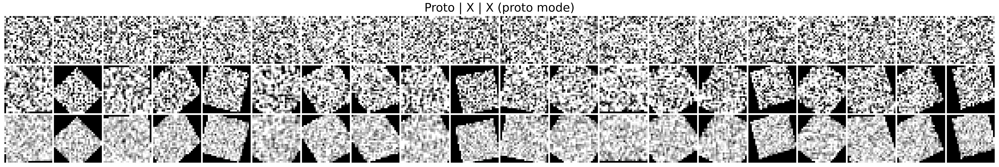

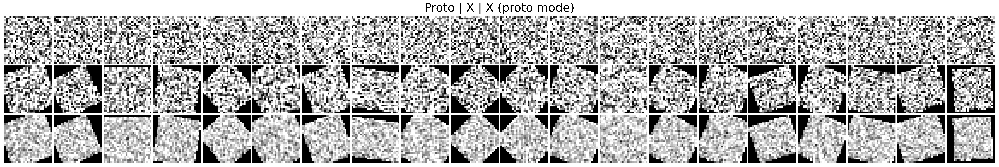

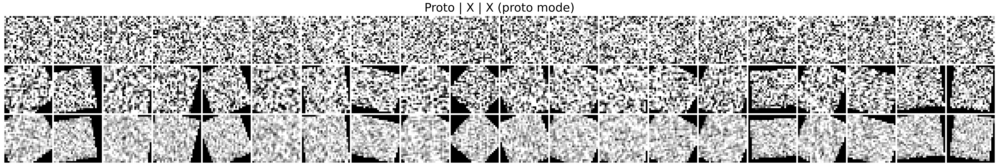

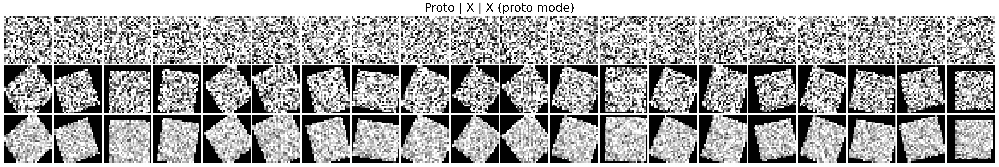

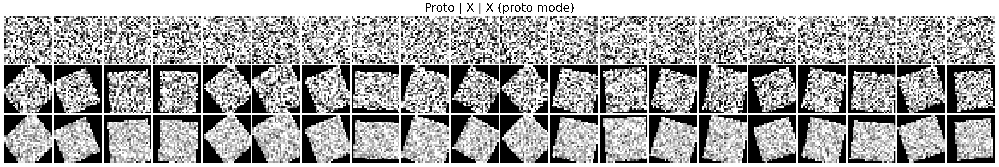

...

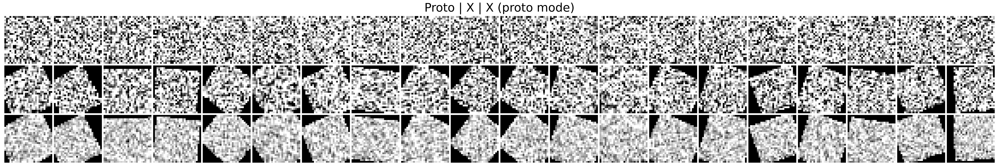

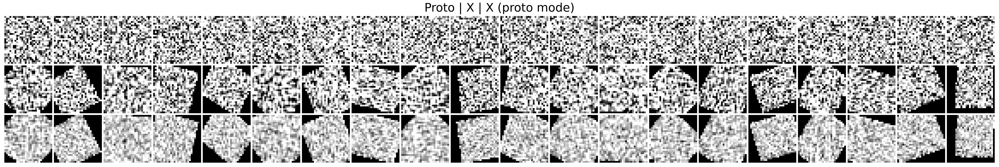

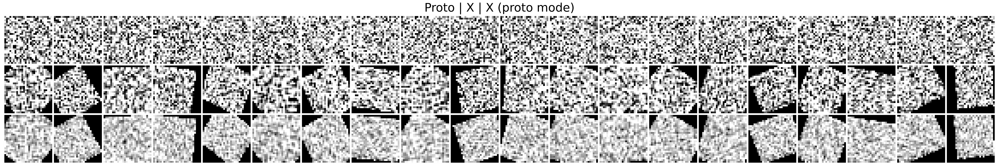

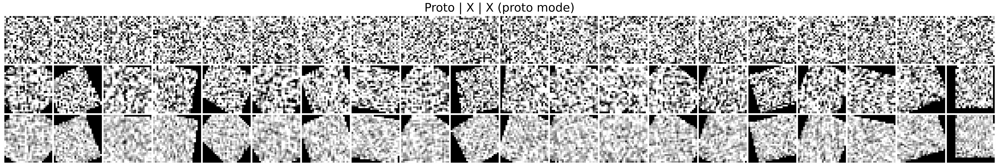

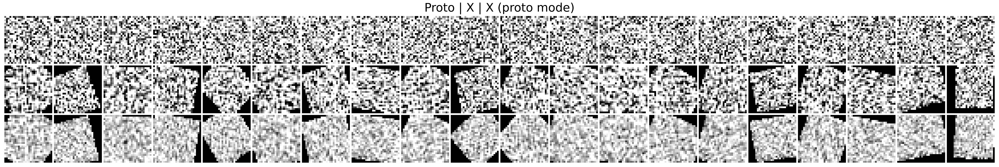

INFO:absl:Initializing model...
INFO:absl:config.model_name = SSILVAE
INFO:absl:config.model = Xhat_given_Z:
  conv_dims:
  - 256
  - 128
  - 64
  dense_dims:
  - 256
Z_given_Xhat:
  conv_dims:
  - 64
  - 128
  - 256
  dense_dims:
  - 256
bounds: !!python/tuple
- 0.25
- 0.25
- 3.141592653589793
- 0.25
- 0.25
latent_dim: 128
offset: !!python/tuple
- 0.0
- 0.0
- 0.0
- 0.0
- 0.0
"\u0397_given_X": &id001
  base:
    conv_dims: []
    dense_dims:
    - 64
    - 32
    - 16
    dropout_rate: 0.0
  conditioner:
    dropout_rate: 0.0
    hidden_dims:
    - 256
    - 128
  num_bins: 5
  num_layers: 1
  trunk:
    conv_dims:
    - 32
    - 64
    - 128
    dense_dims:
    - 256
    dropout_rate: 0.0
"\u0397_given_Xhat": *id001

INFO:absl:input_size = (28, 28, 1)
INFO:absl:Initializing model...


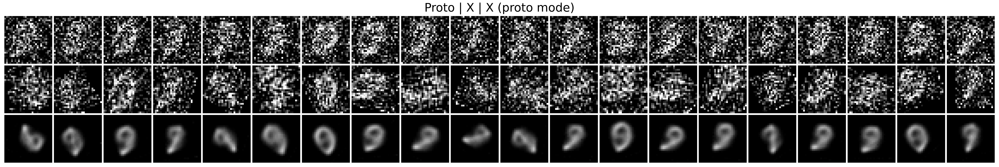

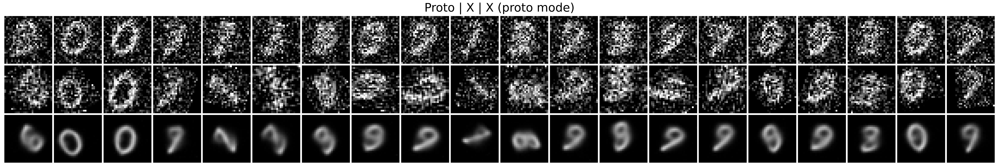

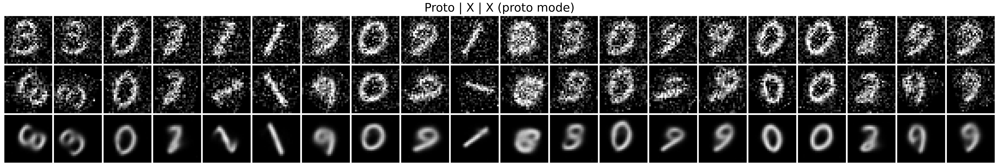

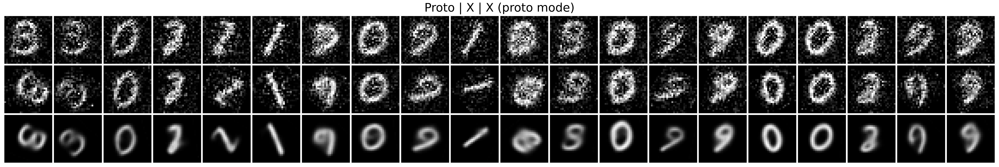

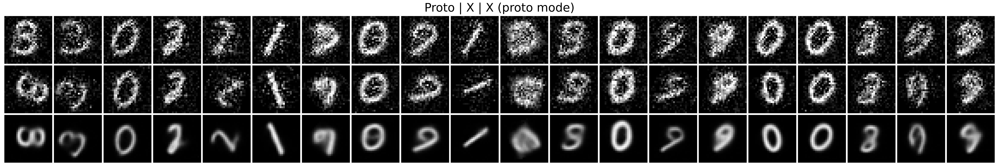

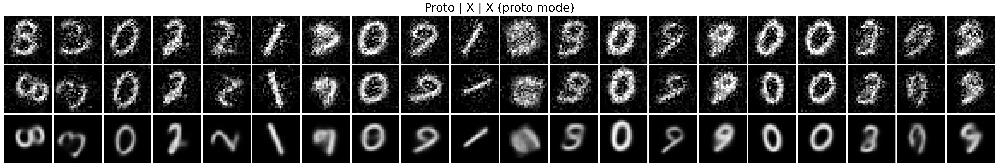

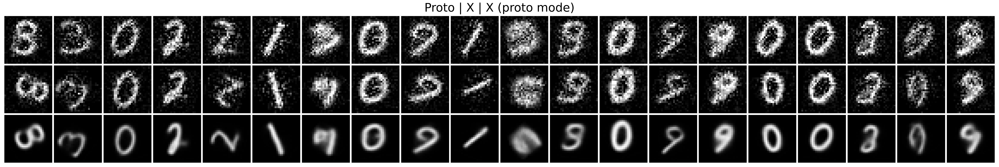

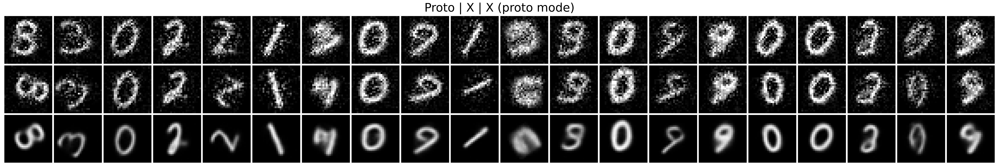

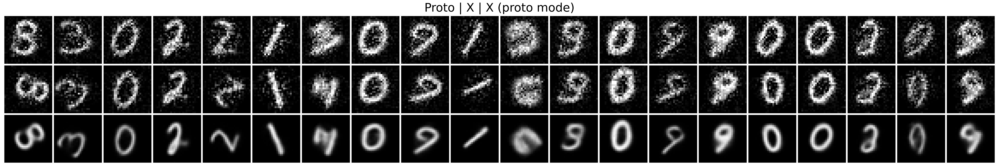

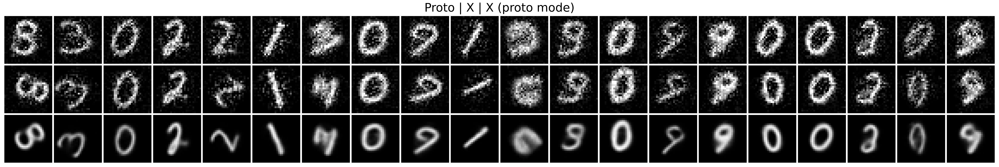

INFO:absl:Training finished.


learing_rate,▃▅████▇▇▆▆▅▅▄▃▃▂▂▂▂▁▂▃▃▃▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁
train/elbo,▁▁▂▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▅▆▆▆▆▆▇▇▇▇▇█████████
train/ll,▁▂▃▅▆▇▇▆▇▇▆▇▇█▇▇████████████████████████
train/ll_unorm,▁▂▃▅▆▇▇▆▇▇▆▇▇█▇▇████████████████████████
train/loss,██▇▇▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▄▃▃▃▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
train/p_q_H_cent,██▆▅▅▇▇▁▄▄▄▃▃▂▃▃▃▃▄▅▃▃▃▃▃▃▃▄▃▄▃▄▃▄▃▃▃▃▄▄
train/p_η_ce,▁▁▁▁▁▂▂▃▂▂▂▂▃▃▃▃▄▅▅█▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆
train/q_H_ent,█▇▆▄▄▅▃▅▅▃▄▃▄▃▂▂▂▂▂▁▁▁▂▂▂▂▂▁▂▂▂▁▂▁▂▁▁▂▁▁
train/q_η_ce,▁▁▂▁▁▃▂▃▂▂▂▂▂▂▃▃▄▅▆█▆▆▆▅▅▅▆▆▅▆▄▆▅▆▅▆▆▆▅▆
train/xhat_ll,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▅▅▅▆▆▆▇▇▇▇████████
train/xhat_ll_unorm,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▄▅▅▅▆▆▆▇▇▇▇████████


In [8]:
best_state, final_state = train_loop(
    config,
    model,
    state,
    train_ds,
    val_ds,
    wandb_kwargs={
        'mode': 'online',
        'tags': ['test', 'SSILVAE'], 
        'notes': (
            'Testing SSILVAE training. Now with a new optimizer halfway. '
            '5k steps per half. '
            'Stronger γ. '
        )
    }
);


In [9]:
if RUN_EXTRA:
    pass
else:
    raise RuntimeError("Set RUN_EXTRA to True to keep running NB.")

RuntimeError: Set RUN_EXTRA to True to keep running NB.

## Make rotation plots

In [ ]:
from src.utils import input as input_utils
from src.models.ssil import make_summary_plot
from src.transformations.affine import transform_image
from src.models.common import (
    Flow,
    approximate_mode,
)
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
import jax
import distrax


summary_rng = random.PRNGKey(0)

[autoreload of src.utils.training failed: Traceback (most recent call last):
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 257, in check
    superreload(m, reload, self.old_objects)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 480, in superreload
    update_generic(old_obj, new_obj)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 377, in update_generic
    update(a, b)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 345, in update_class
    update_instances(old, new)
  File "/var/home/jua23/.virtualenvs/inv/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 303, in update_instances
    ref.__class__ = new
  File "<string>", line 4, in __setattr__
dataclasses.FrozenInstanceError: cannot assign to field '__class__'
]


### Make plot

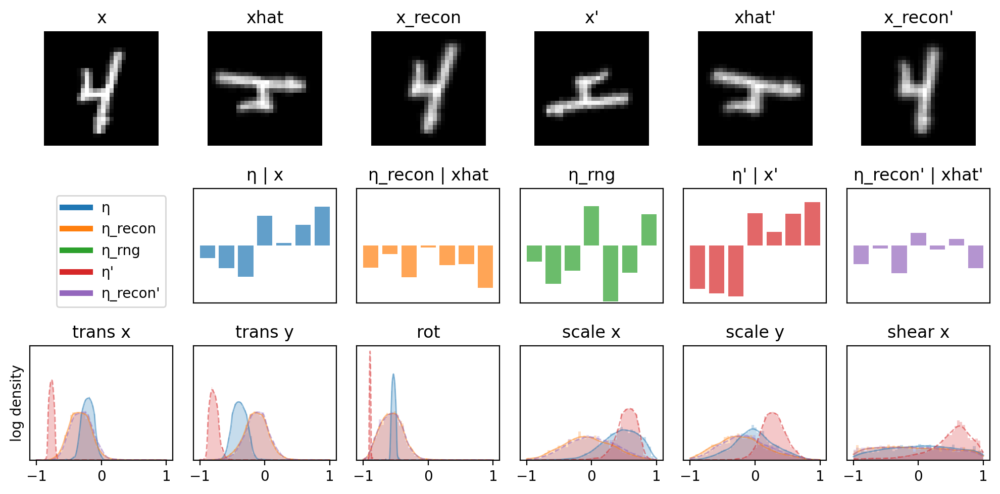

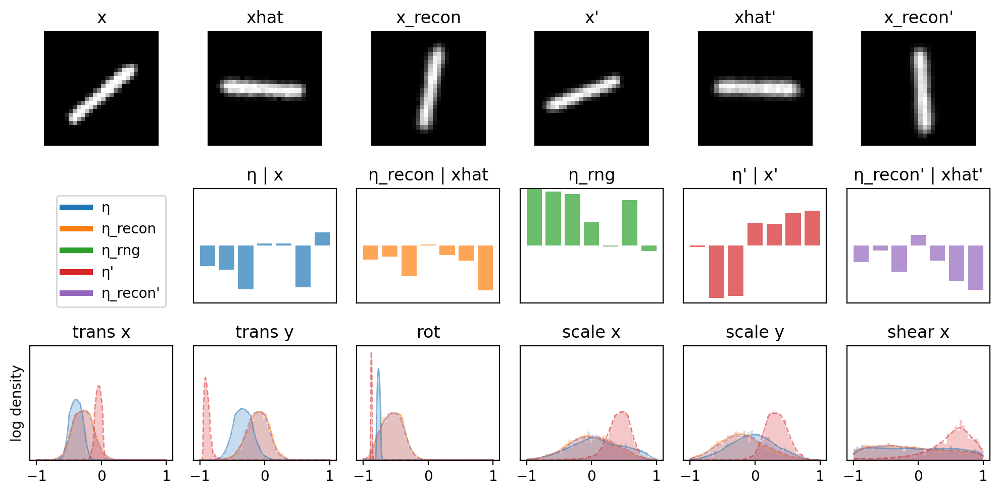

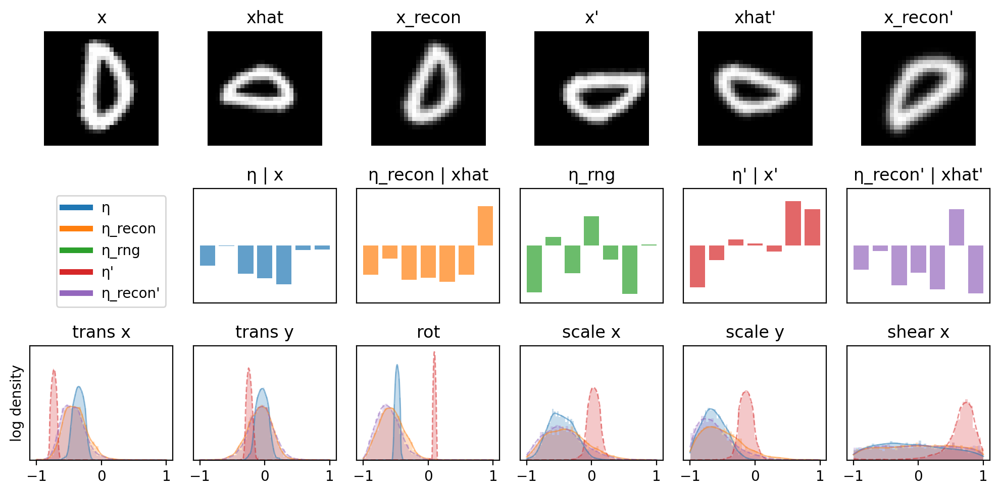

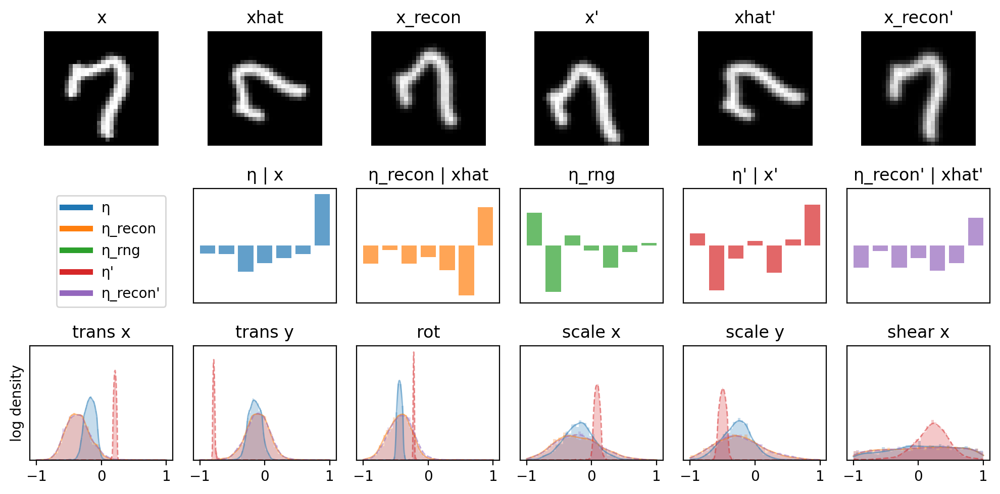

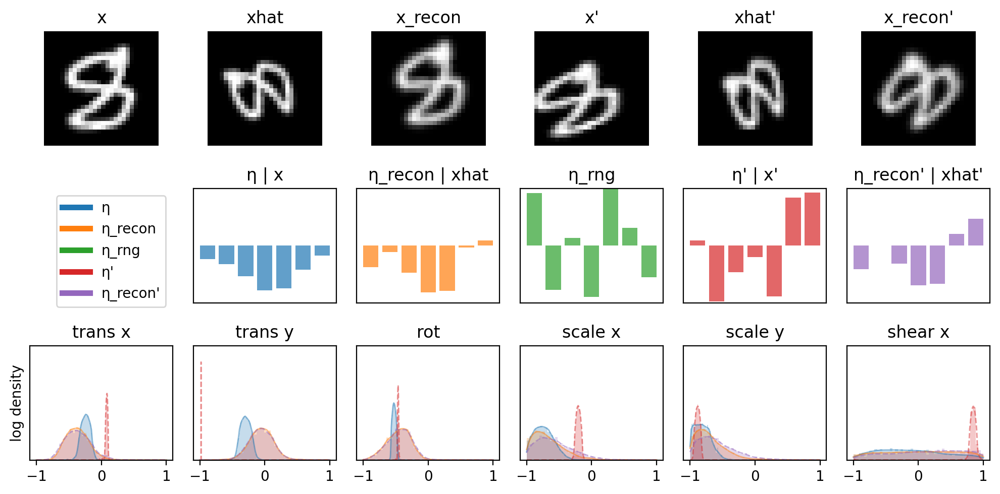

In [ ]:
for i, x in enumerate(val_batch['image'][0][:5]):
    tmp_rng, summary_rng = jax.random.split(summary_rng)
    make_summary_plot(config, final_state, x, tmp_rng)

### Investigate Distributions

In [ ]:
def make_dist_plots(dist, rng, color='C0'):
    samples, _ = dist.sample_and_log_prob(seed=rng, sample_shape=(3000,))
    samples = samples / jnp.array(config.model.bounds)
    _, num_dims = samples.shape

    fig, axs = plt.subplots(1, num_dims, figsize=(20, 4), dpi=400, sharey=True)

    for i in range(num_dims):
        axs[i].hist(samples[:, i], bins=50, density=True, color=color, alpha=0.5)
        # plot a gaussian KDE over the histogram
        x = jnp.linspace(-1, 1, 1000)
        kde = gaussian_kde(samples[:, i])
        axs[i].plot(x, kde(x), color=color)

    fig.tight_layout()
    fig.show()


In [ ]:
η, η_, p_X_given_xhat_and_η, p_Η_given_xhat, q_Η_given_x = model.apply(
    {"params": final_state.params},
    x,
    rng,
    1.0,
    train=False
)


In [ ]:
final_state.params['σ_']

ShardedDeviceArray(0.38065583, dtype=float32)

In [ ]:
p_X_given_xhat_and_η.log_prob(x)

DeviceArray(-752.90405, dtype=float32)

-673.692


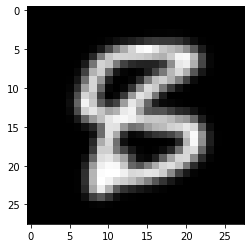

In [ ]:
x_rot = transform_image(x, jnp.array([0, 0, jnp.pi, 0, 0, 0, 0]))
plt.imshow(x_rot, cmap='gray')
print(p_X_given_xhat_and_η.log_prob(x_rot))

-786.0011


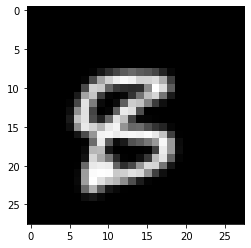

In [ ]:
x_trans = transform_image(x, jnp.array([0.25, 0.25, jnp.pi, 0.25, 0.25, 0, 0]))
plt.imshow(x_trans, cmap='gray')
print(p_X_given_xhat_and_η.log_prob(x_trans))

In [ ]:
η = approximate_mode(q_Η_given_x, 100, rng)
η

DeviceArray([-0.05048791, -0.07518937, -1.6429071 , -0.18842126,
             -0.2245992 , -0.01341782,  0.00817552], dtype=float32)

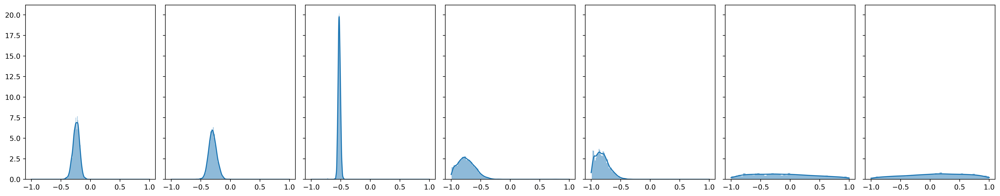

In [ ]:
make_dist_plots(q_Η_given_x, rng)

In [ ]:
q_Η_given_x.log_prob(η)

DeviceArray(18.315418, dtype=float32)

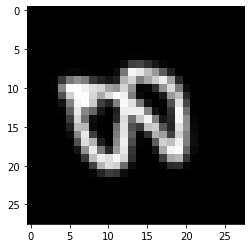

In [ ]:
x_hat = transform_image(x, -η)
plt.imshow(x_hat, cmap='gray')

In [ ]:
η2 = approximate_mode(p_Η_given_xhat, 1000, rng)
η2

DeviceArray([-0.11624698, -0.03274662, -1.7531292 , -0.24303898,
             -0.20750642,  0.02477482, -0.02615862], dtype=float32)

In [ ]:
p_Η_given_xhat.log_prob(η2)

DeviceArray(13.689987, dtype=float32)

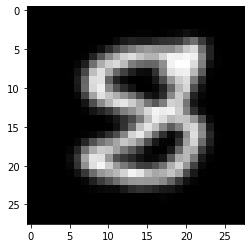

In [ ]:
x_rec = transform_image(x_hat, η2)
plt.imshow(x_rec, cmap='gray')

In [ ]:
q_Η_given_x.event_shape

JaxTransformError: Jax transforms and Flax models cannot be mixed. (https://flax.readthedocs.io/en/latest/flax.errors.html#flax.errors.JaxTransformError)